# Buildmodel

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism

## Sample data

First we generate some typical test data to play with

In [31]:
include("ChaosFunctions.jl")

addnoise (generic function with 1 method)

In [32]:
using Plots

In [33]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   4.28449   3.72661   3.73862
 -9.09342  -8.3313   -7.63451  -7.18491      2.51742   3.21925   4.26658
 28.5537   28.7701   28.4925   27.8354      25.0368   22.4357   20.2786

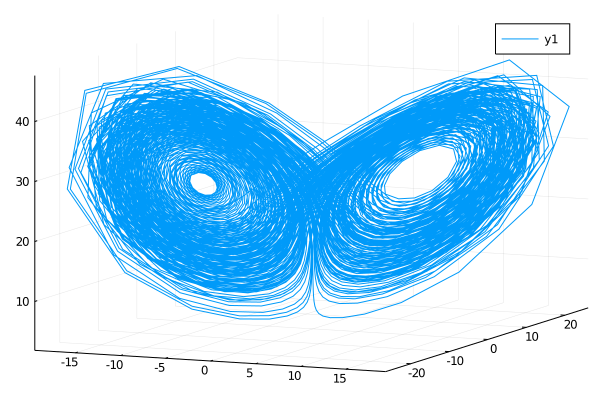

In [34]:
plot(z[1,:],z[2,:],z[3,:])

In [35]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -1.22664    -2.12111    -2.96475
 -1.45337    -1.90718    -2.303         4.50527     4.34763     4.00557
  0.0252208   0.0261013   0.027361      0.0330904   0.0282273   0.0247636

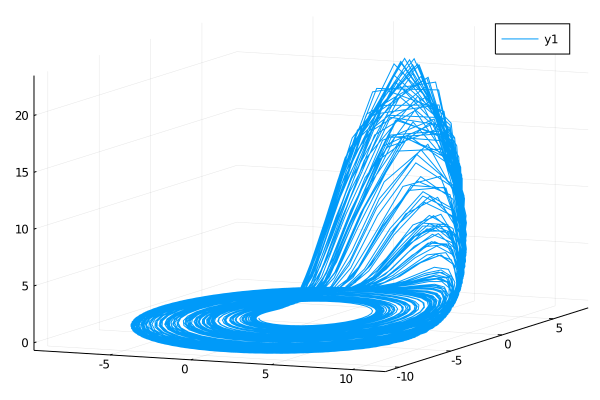

In [36]:
plot(z[1,:],z[2,:],z[3,:])

In [37]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

In [38]:
plot(z[2,:],z[1,:],linetype=:dots)

In [39]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.137038  -0.00596612   0.109033  …  -0.0628135  -0.414743  -0.151674
 -0.410868  -0.334477    -0.163737     -1.00581    -0.503922  -0.712031

In [40]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=0.1)

In [41]:
plot(zn[1,:],linetype=:dots,markersize=0.5)

In [42]:
z=itmap(logistic,1/π,10^4);

In [43]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=0.1)

## Build the model

Import the modelling code, and away we go.

In [44]:
include("BasisFunctionTypes.jl")
include("Place.jl")

Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [45]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [46]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [47]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999
needδ=true
*MSS=0.12384630306152068 DL=3000.7682465386347 size=1
*MSS=0.014742166562674783 DL=-5510.565898410931 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.012556993445063926 DL=-6146.312661477835 size=2
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
MSS=0.013534119810301296 DL=-5846.605596262487 size=2
*MSS=0.006571954234675026 DL=-8728.281714409119 size=3
*MSS=0.006227403100688372 DL=-8935.831087717395 size=4
MSS=0.006236035907381668 DL=-8930.02857917731 size=4
*MSS=0.005827792708129591 DL=-9194.150519059345 size=5
*MSS=0.003083862129175873 DL=-11738.78803151622 size=5
*MSS=0.0025555559503356445 DL=-12488.557660759738 size=5
MSS=0.0025524619885282027 DL=-12485.792134892226 size=6
MSS=0.002553286154336826 DL=-12484.873722282224 size=6
*MSS=0.0025392208864115323 DL=-12500.69540371447 size=7
MSS=0.0025368656687798086 DL=-12497.602118716428 size=8
*MSS=0.002510678546044456 DL=-12539.864000823583 size=8
*MSS=0.0025004553923894087

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [0], 0.10552678615146187, [0.5434889127994574 0.15355362027842603 … 0.8532536592656869 0.6141033859440533], [4.276094383236543]), Main.Place.BasisFunc(tophat, [0], 0.48019122713036744, [0.5434889127994574 0.15355362027842603 … 0.8532536592656869 0.6141033859440533], [4.3850768542372585]), Main.Place.BasisFunc(gaussian, [0], 0.17926234507962605, [0.5434889127994574 0.15355362027842603 … 0.8532536592656869 0.6141033859440533], Any[]), Main.Place.BasisFunc(tophat, [1], 0.252388284830674, [0.833163913335895 0.04369527427481221 … 0.6908214123840823 0.8324418047428058], [3.1390829663741173]), Main.Place.BasisFunc(tophat, [1], 0.5925654103326123, [0.833163913335895 0.04369527427481221 … 0.6908214123840823 0.8324418047428058], [4.741795373499485]), Main.Place.BasisFunc(tophat, [2], 0.07641116858590653, [0.315584519991685 -0.0027698967771224523 … 0.22358677757395243 0.7107767274231753], [3.434023204577291]), Main.Place.Bas

Modelling done, we can make one-step predictions on time series data

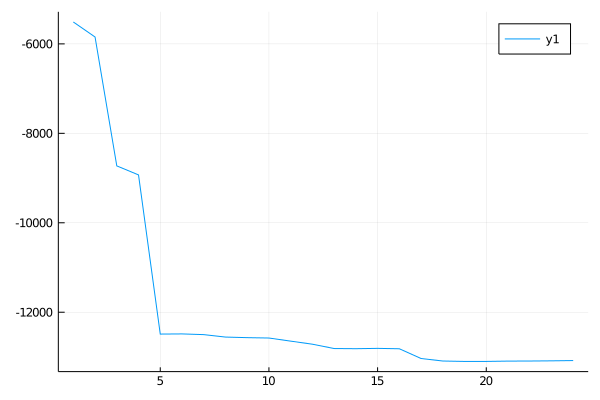

In [48]:
plot(mdlv)

In [49]:
yt,yp,ep = Place.predict(mymodel, z);

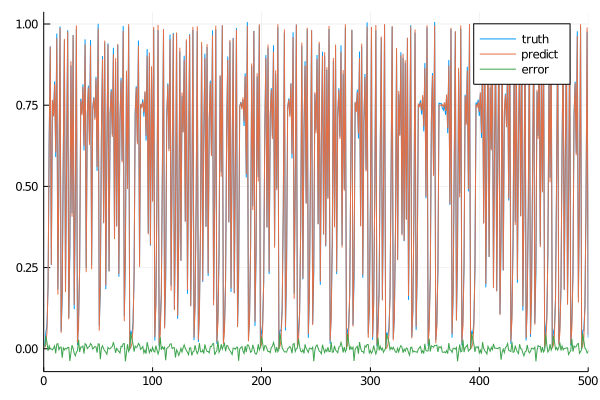

In [50]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

Or, free run simulations

In [51]:
yp, yt = Place.freerun(mymodel,zn,500)

([-0.06384338174744489, -0.07104334717843486, -0.19600674635573884, -0.2854408757145038, -0.4671708721252454, -0.5530559136931661, -0.5788065573980253, -0.5080182586033316, -0.48914669533342525, -0.5251557181788122  …  -0.5221620968950131, -0.522162096895013, -0.522162096895013, -0.5221620968950131, -0.5221620968950131, -0.522162096895013, -0.522162096895013, -0.5221620968950131, -0.5221620968950131, -0.522162096895013], [-0.003846586146009154, 0.05561885803422175, 0.04495478996189037, 0.19828356365464456, 0.632368968785654, 0.9364692843055534, 0.23880814614138748, 0.7448019407734866, 0.7080033555904274, 0.815653530319311  …  0.1808131205736488, 0.46425523802511043, 0.9928316582550272, -0.0044914478073248415, -0.010215710103445836, 0.06641963990112201, 0.12758451193575435, 0.4524807282980545, 0.9640786650536629, 0.06305810053613568])

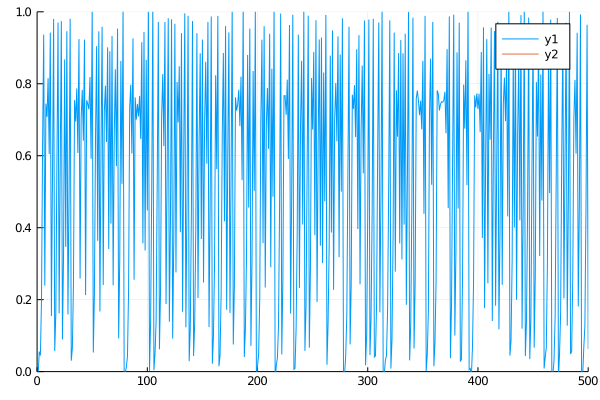

In [52]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


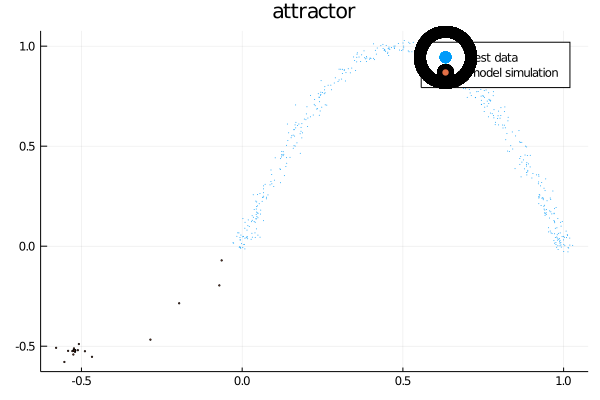

In [53]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=0.1,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=1,label="model simulation",title="attractor")

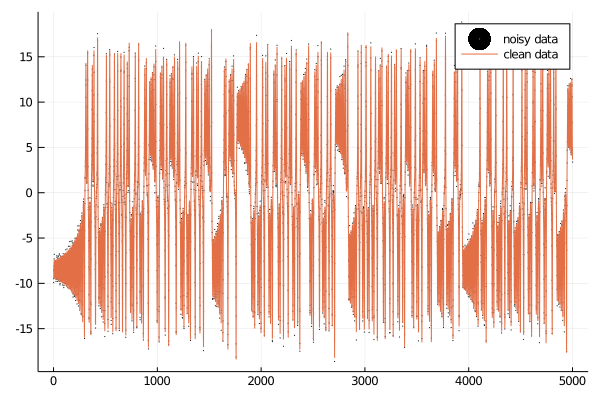

In [54]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=0.5,label="noisy data")
plot!(y,label="clean data")

In [55]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [56]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488
needδ=true
*MSS=4.553099215702048 DL=9773.660563776692 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.0091860753035466 DL=8849.344468111854 size=2
*MSS=2.673736426754237 DL=8589.79273546197 size=3
*MSS=2.6194991784696247 DL=8549.104175577251 size=4
*MSS=1.5445584460726305 DL=7365.310243613234 size=4
MSS=1.5426975969684245 DL=7369.063630378195 size=5
*MSS=1.4832888181758528 DL=7278.077071628525 size=5
MSS=1.4797572925221443 DL=7278.605153586837 size=6
*MSS=1.3740904309526665 DL=7110.46980826782 size=6
*MSS=1.141353478067834 DL=6695.364385080657 size=6
MSS=1.1408696795533821 DL=6700.81629747534 size=7
*MSS=1.0329572643146392 DL=6476.930550747206 size=7
*MSS=0.9869074948569714 DL=6380.9655785162495 size=8
*MSS=0.9819781842003356 DL=6376.163793286481 size=9
*MSS=0.9811546279444071 DL=6373.491804362602 size=9
MSS=0.9792005609167025 DL=6375.41560367447 size=10
*MSS=0.8716453563714264 DL=6111.191020501586 size=10
MSS=0.8706907457907165 DL=6115.272825

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [1, 2, 3, 6], 9.621067280569362, [-8.954628921627918 -8.476399002807936 … -12.032099517948218 15.49130398912217; -6.030351761897479 -7.611809596347829 … -9.69266680369688 14.086087239195455; -3.9007735881659 -6.98921426265065 … -6.396730869982758 11.217318535245887; -1.892267113440727 -7.268503670599677 … -2.634176914893782 3.903645334533245], [3.491973346836404]), Main.Place.BasisFunc(tophat, [2], 2.815686421652481, [-6.030351761897479 -7.611809596347829 … -9.69266680369688 14.086087239195455], [2.340084128278602]), Main.Place.BasisFunc(tophat, [0, 1, 3], 26.599194108347678, [-10.603137237271264 -9.17117922201071 … -16.350212511362418 12.93643277548164; -8.954628921627918 -8.476399002807936 … -12.032099517948218 15.49130398912217; -3.9007735881659 -6.98921426265065 … -6.396730869982758 11.217318535245887], [4.986043130373609]), Main.Place.BasisFunc(tophat, [2], 7.518795372036702, [-6.030351761897479 -7.6118095963

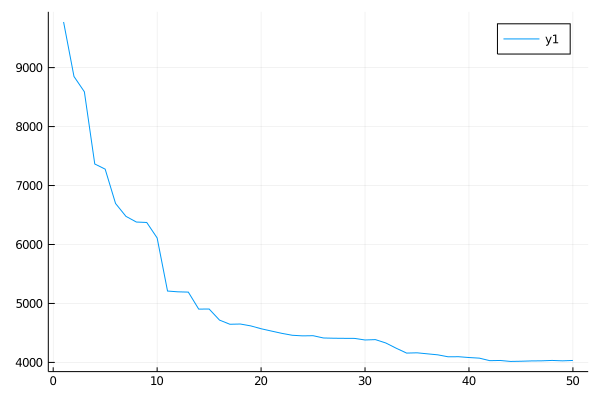

In [57]:
plot(mdlv)

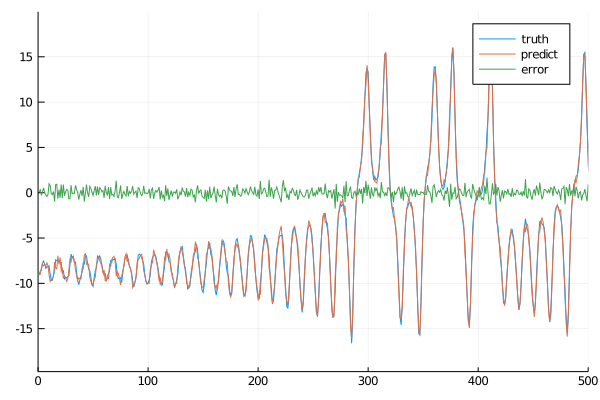

In [58]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

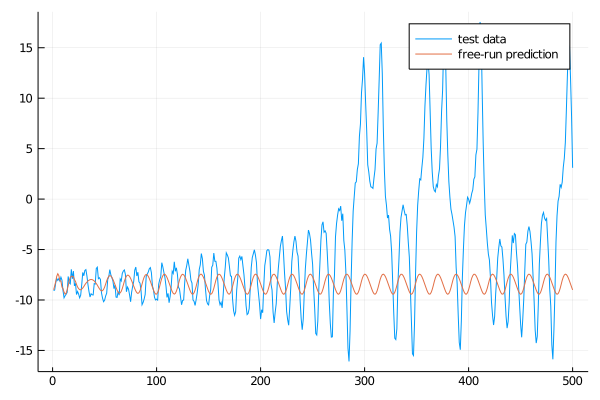

In [59]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

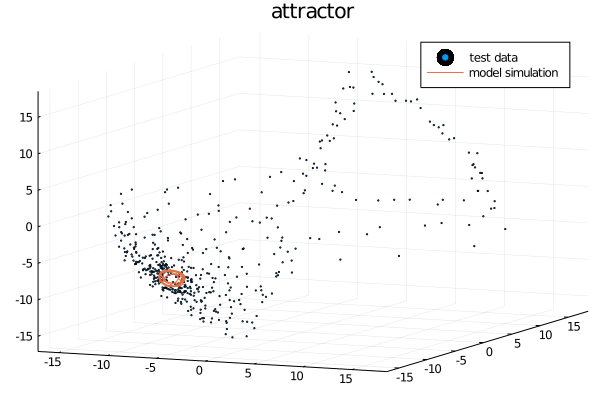

In [60]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small

Last updated today ... 21/12